In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
import random
import seaborn as sns
sns.set_theme()

In [15]:
data = loadmat('cluster_dataset.mat')

In [16]:
X = data['data']
x1 = np.array([i[0] for i in X])
x2 = np.array([i[1] for i in X])

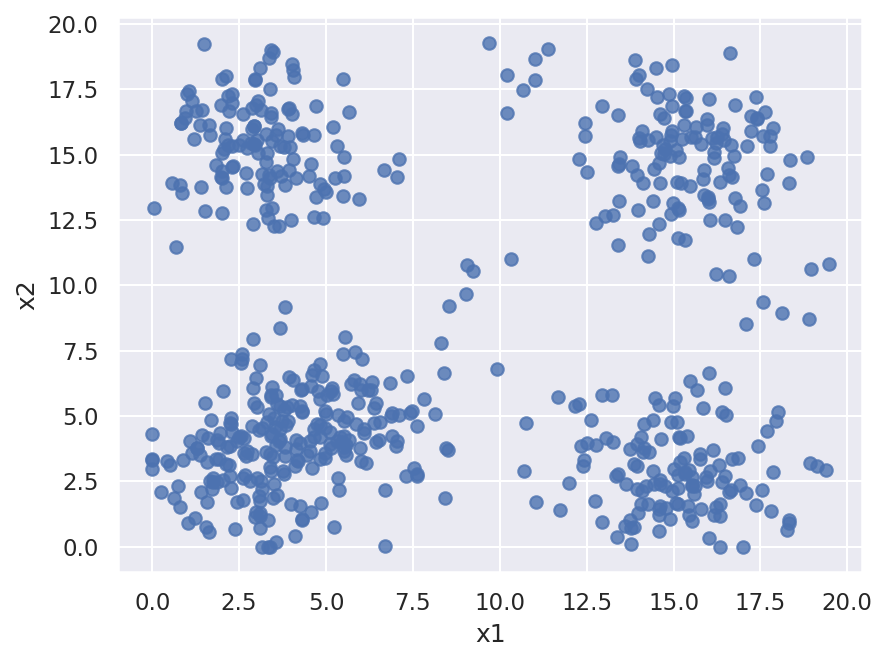

In [17]:
plt.figure(dpi=150)
plt.scatter(x1,x2,color='b',alpha=0.8)
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

In [18]:
#预设聚类簇数k：请观察数据集散点图，预计聚类簇数k
k = 4

In [19]:
#随机选择数据集中k个点作为初始聚类中心
def init_centers(X,k):
    """
    输入：X:数据集(ndarray), k：预设的聚类簇数(int)
    输出：centers：初始化的中心集（建议：元素为ndarray的list)
    可能使用的函数：random.randint
    注意：需保证随机取的样本不重复
    """

    n_samples,n_feature = X.shape #存储样本数量和特征数量，虽然好像这里不要用特征
    randoms = random.sample(range(n_samples),k)
    
    centers = []

    for randx in randoms:
        centers.append(X[randx])#随机选择的聚类中心
    
    return centers

In [20]:
#向量欧氏距离计算，用于计算每个样本和中心的距离，可用于簇分配和代价函数计算
def distance(v1, v2):
    """
    输入：v1:样本(ndarray), v2:当前对应的中心(ndarray)
    输出：distance:欧氏距离(float/ndarray)
    """

    distance = np.sqrt(np.sum((v1-v2)**2))
                       
    return distance

欧式距离：$d=\sqrt{(x_1-x_2)^2+(y_1-y_2)^2}$

In [21]:
#将样本分配到距离最近的中心所在的簇
def cluster_assignment(X, centers):
    """
    输入：X:数据集(ndarray), centers：当前中心集（建议：元素为ndarray的list)
    输出：assignment(建议：字典：key为簇标号、value为元素是ndarray的list)
    可能使用的函数：np.argmin
    注意：list和array在某些计算时的转换
    """
    assignment = {0:[],1:[],2:[],3:[]}#创建空簇以存储数据，由观察得到cluster有4个，其实好像也可以写clusters = [[] for _ in range(k)]
    
    for sample in X:#遍历X中每一个元素，并将他们进行分类
        distances = []#创建一个用于存储距离的列表
        for center in centers:#遍历每一个簇的中心
            center = np.array(center)
            d = distance(sample,center)
            distances.append(d)#计算同哪一个中心距离最近，便于分类
        d_min_index = np.argmin(distances)
        assignment[d_min_index].append(sample)#分类
        print(assignment)
        
    return assignment

In [22]:
#代价函数：所有数据点到当前对应中心的欧氏距离之和的平均值
def cost_function(assignment, centers):
    """
    输入：X:数据集(ndarray), centers：当前中心（建议：元素为ndarray的list)
    输出：cost:代价函数值（float/ndarray）
    可能使用的函数：np.argmin
    注意：list和array在使用np函数计算时的转换
    """
    """
    这一块其实我没看明白，为什么选择的是全局最优秀而不是对每个簇的cost作最优秀演算，是否会出现
    有些地方更差了但是整体变好
    感觉和SA有点像，要跳出局部最优，寻找全局最优
    感觉kmeans有点像贪心算法（
    """
    distances = 0
    n=0
    
    for cluster in assignment:
        
        samples = assignment[cluster]
        center = centers[cluster]
        
        for sample in samples:
            d = distance(sample,center)
            distances += d**2
            n+=1
    cost = distances/n
    
    return cost

In [23]:
#更新中心,满足停机条件（聚类中心不再改变）时结束更新
def center_update(assignment, centers):
    """
    输入：assignment(建议：字典：key为簇标号、value为元素是ndarray的list), centers：当前中心（建议：元素为ndarray的list)
    输出：new_centers:更新的中心集（建议：元素为ndarray的list), stop：停机条件标识（不停机：0/停机：1）
    可能使用的函数：np.mean
    注意：list和array在使用np函数计算时的转换
    """
    new_centers = []
    
    for cluster in assignment:
        samples = assignment[cluster]
        samples = np.array(samples)
        """
        for sample in samples:
            new_center_sum_x += sample[0]
            new_center_sum_y += sample[1]
            n = len(sample)
            center_x = new_center_sum_x/n
            center_y = new_center_sum_y/n
            new_center = np.array([center_x,center_y])
            new_centers.append(new_center)
        """
            #上面使用for循环完成，我自己写一遍看看过程到底怎么样
        center = np.mean(samples, axis=0)
        new_centers.append(center)

    stop=0
    if np.allclose(centers,new_centers):#基本不太可能完全相同，于是我查阅numpy库里的用法，找到了这个近似相等的函数
        stop = 1
    return new_centers, stop

In [24]:
#聚类可视化
def plot_clustering(assignment, centers, epoch):
    color = ['r', 'b', 'c', 'g', 'k', 'w', 'y', 'm']
    plt.figure(dpi=150)
    for k in range(len(centers)):
        cluster = np.array(assignment[k])
        if len(cluster) == 0:
            continue
        x1 = cluster[:,0]
        x2 = cluster[:,1]
        plt.scatter(x1, x2, c=color[k])
        plt.xlabel('x1')
        plt.ylabel('x2')
    for k in range(len(centers)):
        x1 = centers[k][0]
        x2 = centers[k][1]
        plt.scatter(x1, x2, c='k', marker = '*')
        plt.xlabel('x1')
        plt.ylabel('x2')
    plt.title('epoch'+ str(epoch))
    plt.show()

In [25]:
#kmeans及可视化
def kmeans(X, k, max_epoch, plot=True):
    """
    输入：X:数据集(ndarray), k：预设的聚类簇数(int), max_epoch：最大训练轮数(int), plot:是否可视化（True/False)
    输出：assignment(建议：字典：key为簇标号、value为元素是ndarray的list), cost:最终的代价函数值，用于k-cost曲线的绘制（float/ndarray）
    """
    centers = init_centers(X,k)
    for epoch in range(max_epoch):
        assignment = cluster_assignment(X, centers)
        cost = cost_function(assignment, centers)
        new_centers,stop = center_update(assignment, centers)
        if stop == 1:
            break
        centers = new_centers
    if plot:
        x = []
        y = []
        for sample in samples:
            x.append(sample[0])
            y.append(sample[1])
        plt.scatter(x, y, label=cluster)
        for center in centers:
            plt.scatter(center[0], center[1],s=200, marker='x')
        plt.legend()
        plt.show()
    return assignment, cost

In [26]:
max_epoch = 200 

In [28]:
assignment, _ = kmeans(X, k, max_epoch)

{0: [array([1.41514188, 2.09392363])], 1: [], 2: [], 3: []}
{0: [array([1.41514188, 2.09392363])], 1: [array([ 2.28570622, 15.31054399])], 2: [], 3: []}
{0: [array([1.41514188, 2.09392363])], 1: [array([ 2.28570622, 15.31054399]), array([6.52067814, 4.07695415])], 2: [], 3: []}
{0: [array([1.41514188, 2.09392363]), array([3.00818153, 2.62466059])], 1: [array([ 2.28570622, 15.31054399]), array([6.52067814, 4.07695415])], 2: [], 3: []}
{0: [array([1.41514188, 2.09392363]), array([3.00818153, 2.62466059])], 1: [array([ 2.28570622, 15.31054399]), array([6.52067814, 4.07695415]), array([ 3.39901389, 17.52392525])], 2: [], 3: []}
{0: [array([1.41514188, 2.09392363]), array([3.00818153, 2.62466059]), array([4.55991728, 1.31692614])], 1: [array([ 2.28570622, 15.31054399]), array([6.52067814, 4.07695415]), array([ 3.39901389, 17.52392525])], 2: [], 3: []}
{0: [array([1.41514188, 2.09392363]), array([3.00818153, 2.62466059]), array([4.55991728, 1.31692614]), array([1.02087886, 0.88726942])], 1: 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{0: [array([1.41514188, 2.09392363]), array([3.00818153, 2.62466059]), array([4.55991728, 1.31692614]), array([1.02087886, 0.88726942]), array([2.0389781, 2.53329  ]), array([3.57245978, 3.89725524]), array([3.07952575, 4.46479802]), array([2.44891575, 4.04099996]), array([3.79474264, 2.77877712]), array([3.15944218, 2.19443895]), array([1.94114166, 4.36389334]), array([2.24490901, 4.74232096]), array([2.56900805, 4.22522548]), array([3.67360798, 4.10371034]), array([7.30603726, 2.70262056]), array([3.34254999, 1.00681795]), array([4.85375293, 1.68690829]), array([3.15532408, 4.54983198]), array([5.34503803, 2.63875792]), array([1.22986404, 1.0860694 ]), array([4.15158781, 3.73140347]), array([1.65725196, 2.5052602 ]), array([2.69222246, 3.48247575]), array([1.9169248 , 3.97868206]), array([6.1385838 , 3.20057265]), array([0.73540681, 2.32696748]), array([4.15119816, 4.07869081]), array([1.57677691, 1.69470354]), array([3.39037219, 3.05729822]), array([1.30031406, 3.75774789]), array([

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{0: [array([1.41514188, 2.09392363]), array([6.52067814, 4.07695415]), array([3.00818153, 2.62466059]), array([4.55991728, 1.31692614]), array([1.02087886, 0.88726942]), array([6.88687549, 5.10802957]), array([2.0389781, 2.53329  ]), array([5.57122478, 3.89134465]), array([3.57245978, 3.89725524]), array([3.93897135, 6.504729  ]), array([3.07952575, 4.46479802]), array([2.44891575, 4.04099996]), array([8.14356021, 5.05642168]), array([3.79474264, 2.77877712]), array([3.15944218, 2.19443895]), array([1.94114166, 4.36389334]), array([4.8285165 , 4.20309285]), array([5.92249114, 5.49800025]), array([3.51691125, 4.90475943]), array([6.09112475, 4.50357319]), array([2.24490901, 4.74232096]), array([2.56900805, 4.22522548]), array([4.56894906, 6.14806761]), array([6.10423039, 4.35804724]), array([3.67360798, 4.10371034]), array([7.30603726, 2.70262056]), array([6.56019157, 4.76470819]), array([6.3722554 , 4.74409835]), array([3.34254999, 1.00681795]), array([4.85375293, 1.68690829]), array([

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



{0: [array([1.41514188, 2.09392363]), array([6.52067814, 4.07695415]), array([3.00818153, 2.62466059]), array([4.55991728, 1.31692614]), array([1.02087886, 0.88726942]), array([6.88687549, 5.10802957]), array([2.0389781, 2.53329  ]), array([5.57122478, 3.89134465]), array([3.57245978, 3.89725524]), array([3.93897135, 6.504729  ]), array([3.07952575, 4.46479802]), array([2.44891575, 4.04099996]), array([8.14356021, 5.05642168]), array([3.79474264, 2.77877712]), array([3.15944218, 2.19443895]), array([1.94114166, 4.36389334]), array([4.8285165 , 4.20309285]), array([5.92249114, 5.49800025]), array([3.51691125, 4.90475943]), array([6.09112475, 4.50357319]), array([2.24490901, 4.74232096]), array([2.56900805, 4.22522548]), array([4.56894906, 6.14806761]), array([6.10423039, 4.35804724]), array([3.67360798, 4.10371034]), array([7.30603726, 2.70262056]), array([6.56019157, 4.76470819]), array([6.3722554 , 4.74409835]), array([2.5756943 , 7.18699883]), array([3.34254999, 1.00681795]), array([

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [ ]:
#绘制簇数-代价函数曲线：根据曲线，观察最合适的簇数k的选择
plt.figure(dpi=150)
Cost = []
max_k = 6
for k in range(1, max_k):
    _, cost = kmeans(X, k, max_epoch,False)
    Cost.append(cost)

plt.plot(range(1,max_k), Cost, c='b', marker = '*')
plt.xticks(range(1,max_k))
plt.xlabel('k')
plt.ylabel('cost')
plt.title('k-cost curve')
plt.show()